<a target="_blank" href="https://colab.research.google.com/github/RSNA/AI-Deep-Learning-Lab-2023/blob/main/sessions/image-generation/RSNA2023_DLL_DDPM.ipynb">
  <img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/>
</a>

# RSNA 2023 Deep Learning Lab: **Medical Image Generation**

Presented by:  Bardia Khosravi, MD MPH MHPE<sup>\*</sup> <a href="https://twitter.com/Khosravi_Bardia"><img width="16" src="https://i.ibb.co/J7Tpg3Q/twitter-logo-2429.png"></a>, Bradley J. Erickson, MD PhD<sup>\*</sup> <a href="https://twitter.com/Slowvak"><img width="16" src="https://i.ibb.co/J7Tpg3Q/twitter-logo-2429.png"></a>


\* *Mayo Clinic AI Lab, Department of Radiology, Mayo Clinic, Rochester, MN* <a href="https://twitter.com/MayoAILab\"><img width="16" src="https://i.ibb.co/J7Tpg3Q/twitter-logo-2429.png"></a>

In this netbook we will explore what we can do with diffusion models. We will start with imports and function definitons. Then, we indtoduce a UI for exploring the options to work with diffusion models.

During this workshop, you will learn how to:
- Emulate the forward and reverse diffusion processes
- Create an image with a diffusion model
- Inpaint lesions with a diffusion model

As training diffusion models requires a moderate amount of compute and time, we use an already trained model. This model was trained on the [Kermany et al.](https://www.kaggle.com/datasets/paultimothymooney/chest-xray-pneumonia?datasetId=17810) dataset which comprises of 5,000 pediatric chest radiographs which are either normal, or have bacterial or viral pneumonia. To learn more about the training pipeline, check-out [here](https://colab.research.google.com/github/Mayo-Radiology-Informatics-Lab/MIDeL/blob/main/chapters/15_3B.ipynb).

Before starting, we need to install the `Mediffusion` (diffusion model training and inference) and `Gradio` (for final demo) packages:

In [ ]:
!pip install mediffusion==0.70 gradio -q

In order for all the packages to work properly we advice to restart your runtime at this point. To do this, you can go to the `Runtime` menu item at the top and select `Restart runtime`.

Then we import our packages:

In [ ]:
import gdown
import os
import zipfile
import torch
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline
from mediffusion import DiffusionModule
import bkh_pytorch_utils as bpu
import monai as mn
from tqdm import tqdm
import imageio
from IPython.display import HTML
from base64 import b64encode

We will next download the trained model weights and configs:

In [ ]:
if not os.path.isdir("workshop_data"):
    gdown.download(
        "https://drive.google.com/uc?export=download&confirm=pbef&id=1r_lLkw8JQR2EUCPI6TLqsq5S_mV2SOQU",
        "workshop_data.zip",
        quiet=False,
    )
    os.mkdir("workshop_data")

    with zipfile.ZipFile("workshop_data.zip", 'r') as zip_ref:
        zip_ref.extractall("workshop_data")

    os.remove("workshop_data.zip")

    gdown.download(
        "https://drive.google.com/uc?export=download&confirm=pbef&id=1L_gKWO87A4qCL1H95yfMA3TmEwXjhtr8",
        "ddpm_weights.zip",
        quiet=False,
    )
    with zipfile.ZipFile("ddpm_weights.zip", 'r') as zip_ref:
        zip_ref.extractall("workshop_data")

    os.remove("ddpm_weights.zip")

## Emulating the Diffusion Process

Let's load an image from the dataset:

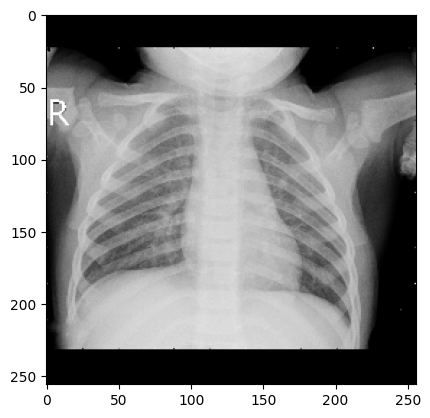

In [ ]:
original_image_path = "./workshop_data/chest_xray/val/NORMAL/NORMAL2-IM-1430-0001.jpeg"

data = {
    "img": original_image_path,
}

transforms = mn.transforms.Compose([
    mn.transforms.LoadImageD(keys="img"),
    bpu.EnsureGrayscaleD(keys="img"),
    mn.transforms.ResizeD(keys='img', size_mode="longest", mode="bilinear", spatial_size=256),
    mn.transforms.ScaleIntensityRangePercentilesD(keys="img", lower=0, upper=100, b_min=-1, b_max=1, clip=True),
    mn.transforms.SpatialPadD(keys='img', spatial_size=(256, 256), mode="constant", constant_values=-1),
    mn.transforms.SelectItemsD(keys=["img"]),
    mn.transforms.ToTensorD(keys=["img"], dtype=torch.float, track_meta=False),
])

original_image = transforms(data)['img']
plt.imshow(original_image.permute(2, 1, 0).cpu().numpy(), cmap="gray")

We can instantiate a diffusion model by providing a config file in a `.yaml` file:

In [ ]:
model = DiffusionModule("./workshop_data/config.yaml")

By using the `q_sample` method of the diffusion object of the model, we can see the forward diffusion process:

In [ ]:
original_image = original_image.unsqueeze(0) # adding the batch dimension

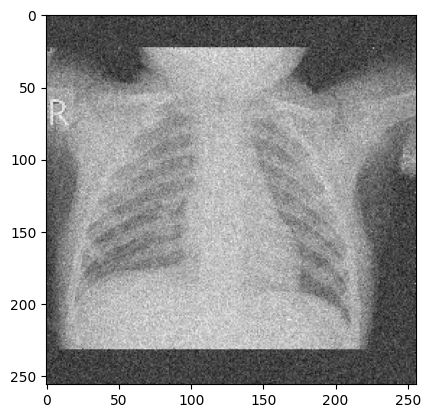

In [ ]:
t = torch.tensor([120])
noisy_sample = model.diffusion.q_sample(original_image, t)
plt.imshow(noisy_sample[0].permute(2,1,0).cpu().numpy(), cmap="gray")

We can see the diffusion process in a video:

In [ ]:
noisy_samples = []

for i in tqdm(range(0, 1000)):
    t = torch.tensor([i])
    noisy_sample = model.diffusion.q_sample(original_image, t)
    noisy_sample_np = noisy_sample.squeeze().detach().numpy()
    noisy_sample_np = (noisy_sample_np - noisy_sample_np.min()) / (noisy_sample_np.max() - noisy_sample_np.min())
    noisy_sample_np = (noisy_sample_np * 255).astype(np.uint8).transpose(1,0)
    noisy_samples.append(noisy_sample_np)

imageio.mimsave('forward_diffusion.mp4', noisy_samples, fps=60)

100%|██████████| 1000/1000 [00:01<00:00, 634.03it/s]


In [ ]:
def show_video(video_path, video_width=256):
    # Read the video file
    video_file = open(video_path, "r+b").read()

    # Encode the video file in base64 and create a data URL
    video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"

    # Return HTML that embeds the video in the notebook
    return HTML(f"""<video width="{video_width}" controls><source src="{video_url}" type="video/mp4"></video>""")

show_video('forward_diffusion.mp4')

## Conditional Image Generation

Let's load the pre-trained weights:

In [ ]:
model.load_ckpt("./workshop_data/last.ckpt", ema=True)
model.eval().cuda().half();

As mentioned, diffusion models wirk by iteratively denoising an image. After training them, we can start *denoising* pure noise. Let's create a function that streamlines the inference:

In [ ]:
def create_image(class_label, noise = None):
    global model
    if noise is None:
        noise = torch.randn(1, 1, 256, 256)

    class_label = torch.tensor([class_label])
    model_kwargs = {"cls": torch.nn.functional.one_hot(class_label,num_classes=3)}

    img = model.predict(
        noise,
        model_kwargs=model_kwargs,
        classifier_cond_scale=4,
        inference_protocol="DDIM100"
    )

    return img[0]

Testing the model:

DDIM Sampling: 100%|██████████| 100/100 [00:03<00:00, 31.97it/s]


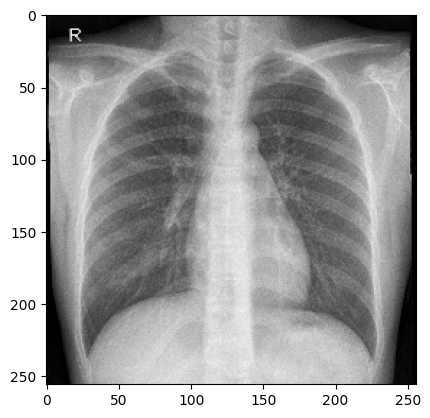

In [ ]:
sample = create_image(0)

plt.imshow(sample.permute(2,1,0).cpu().numpy(), cmap="gray")

Class number `0` represents *normal*, `1` represents *bacterial pneumonia*, and `2` represents *viral pneumonia*. Let's create a pneumonia sample:

DDIM Sampling:   4%|▍         | 4/100 [00:00<00:03, 31.99it/s]

DDIM Sampling: 100%|██████████| 100/100 [00:03<00:00, 32.05it/s]


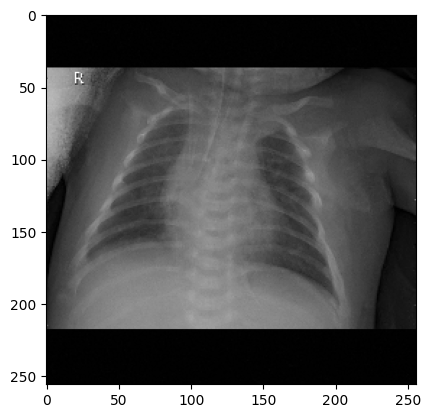

In [ ]:
sample2 = create_image(2)

plt.imshow(sample2.permute(2,1,0).cpu().numpy(), cmap="gray")

## Image Inpainting

Now that the model works, let's do some inpaintig with it:

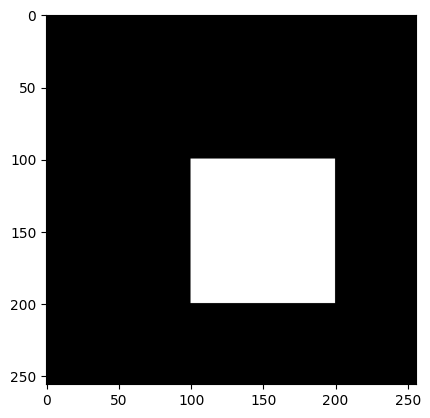

In [ ]:
mask = torch.zeros(1,1,256,256)
mask[:,:,100:200, 100:200] = 1
plt.imshow(mask[0].permute(2, 1, 0).cpu().numpy(), cmap="gray")

We will use the image that we load the begining of this tutorial for as our source image. Now that we have a mask, let's create a function that gets the original image, and a mask and inpaints the masked area:

In [ ]:
def inpaint_image(original_image, mask, class_label, noise = None):
    global model
    if noise is None:
        noise = torch.randn(1, 1, 256, 256)

    class_label = torch.tensor([class_label])
    model_kwargs = {"cls": torch.nn.functional.one_hot(class_label,num_classes=3)}

    img = model.predict(
        noise,
        model_kwargs=model_kwargs,
        classifier_cond_scale=4,
        inference_protocol="DDIM100",
        mask=mask,
        original_image=original_image,
    )

    return img[0]

Testing the model:

DDIM Sampling:   8%|▊         | 8/100 [00:00<00:02, 31.61it/s]

DDIM Sampling: 100%|██████████| 100/100 [00:03<00:00, 31.87it/s]


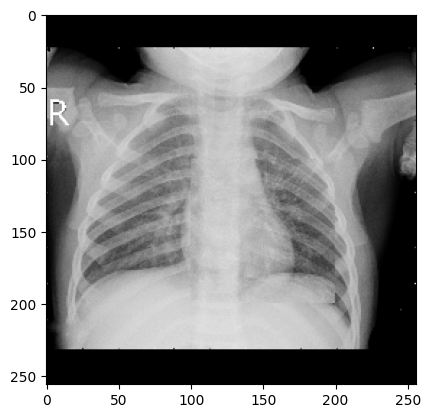

In [ ]:
inpainted_sample1 = inpaint_image(original_image, mask, 0)

plt.imshow(inpainted_sample1.permute(2,1,0).cpu().numpy(), cmap="gray")

We can see what is spacifically different in the inpainted regions:

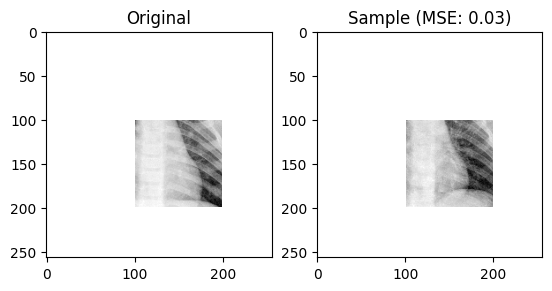

In [ ]:
def plot_inpainted_areas(original_image, sample, mask):
    mask = mask.to(dtype=original_image.dtype)

    inpainted_area_original = original_image * mask
    inpainted_area_original[mask == 0] = float('nan')

    inpainted_area_sample = sample * mask
    inpainted_area_sample[mask == 0] = float('nan')

    non_nan_mask = ~torch.isnan(inpainted_area_original)
    non_nan_original = inpainted_area_original[non_nan_mask]
    non_nan_sample = inpainted_area_sample[non_nan_mask]
    mse_diff = torch.nn.functional.mse_loss(non_nan_original, non_nan_sample, reduction='mean')
    fig, axs = plt.subplots(1, 2)

    axs[0].imshow(inpainted_area_original.permute(2, 1, 0).cpu().numpy(), cmap="gray")
    axs[0].set_title("Original")
    axs[1].imshow(inpainted_area_sample.permute(2, 1, 0).cpu().numpy(), cmap="gray")
    axs[1].set_title(f"Sample (MSE: {mse_diff:.2f})")
    return fig


_ = plot_inpainted_areas(original_image[0], inpainted_sample1[0], mask[0])

## Interactive Demo

Now let's put a user interface (UI) together to streamline testing the model capabilities. We will use [gradio](https://www.gradio.app/) which is among one of the easiest ways of putting together a demo:

You might need to restart your kernel for the installed packages to

In [ ]:
import gradio as gr
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas
import cv2

We need some adaptor functions to process the input from the UI and send them to our defined utility functions:

In [ ]:
def create_image_adaptor(class_label, seed):
    torch.manual_seed(seed)
    noise = torch.randn(1, 1, 256, 256)

    generated_image = create_image(class_label, noise).numpy()

    generated_image = generated_image[0]             # removing channel dimension for visualization
    generated_image = generated_image.transpose(1,0) # swapping axes to make sure proper visualization
    generated_image = (generated_image + 1) * 127.5  # bringing back the range to 0-255
    generated_image = generated_image.astype("uint8")
    return generated_image

def inpaint_image_adaptor(painted_image, class_label, seed):
    img_transforms = mn.transforms.Compose([
        bpu.EnsureGrayscaleD(keys="img"),
        mn.transforms.ResizeD(keys='img', size_mode="longest", mode="bilinear", spatial_size=256),
        mn.transforms.ScaleIntensityRangePercentilesD(keys="img", lower=0, upper=100, b_min=-1, b_max=1, clip=True),
        mn.transforms.SpatialPadD(keys='img', spatial_size=(256, 256), mode="constant", constant_values=-1),
        mn.transforms.SelectItemsD(keys=["img"]),
        mn.transforms.ToTensorD(keys=["img"], dtype=torch.float, track_meta=False),
    ])
    mask_transforms = mn.transforms.Compose([
        bpu.EnsureGrayscaleD(keys="img"),
        mn.transforms.ResizeD(keys='img', size_mode="longest", mode="nearest", spatial_size=256),
        mn.transforms.ScaleIntensityRangePercentilesD(keys="img", lower=0, upper=100, b_min=0, b_max=1, clip=True),
        mn.transforms.SpatialPadD(keys='img', spatial_size=(256, 256), mode="constant", constant_values=0),
        mn.transforms.SelectItemsD(keys=["img"]),
        mn.transforms.ToTensorD(keys=["img"], dtype=torch.float, track_meta=False),
    ])

    torch.manual_seed(seed)
    noise = torch.randn(1, 1, 256, 256)

    # processing multi-layer mask
    mask = painted_image['layers'][0]
    mask = mask_transforms({"img": mask})['img']
    painted_image['layers'] = painted_image['layers'][1:]
    for mask_layer in painted_image['layers']:
        mask2 = mask_transforms({"img": mask_layer})['img']
        mask = np.logical_or(mask, mask2)

    # process the image and mask to proper size
    original_image = img_transforms({"img": painted_image['background']})['img']
    mask[mask<1] = 0           # making sure the mask is binary after resizing
    original_image = original_image.unsqueeze(0).transpose(-1,-2)
    mask = mask.unsqueeze(0).transpose(-1,-2)
    print(original_image.shape, mask.shape)

    inpainted_image = inpaint_image(original_image, mask, class_label, noise)
    areas_fig = plot_inpainted_areas(original_image[0], inpainted_image[0], mask[0])

    inpainted_image = inpainted_image[0].numpy()     # removing channel dimension for visualization
    inpainted_image = inpainted_image.transpose(1,0) # swapping axes to make sure proper visualization
    inpainted_image = (inpainted_image + 1) * 127.5  # bringing back the range to 0-255
    inpainted_image = inpainted_image.astype("uint8")

    # Create a new figure with 3 subplots
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))

    # Add the inpainted figure to the first subplot
    axs[0].imshow(cv2.cvtColor(inpainted_image, cv2.COLOR_BGR2RGB))
    axs[0].imshow(mask[0].permute(2,1,0), cmap='viridis', alpha=0.1)
    axs[0].axis('off')

    # Add the two images from areas_fig to the remaining subplots
    axs[1].imshow(areas_fig.axes[0].get_images()[0].get_array(), cmap='gray')
    axs[1].set_title("Original")
    axs[1].axis('off')

    axs[2].imshow(areas_fig.axes[1].get_images()[0].get_array(), cmap='gray')
    axs[2].set_title(f"Sample")
    axs[2].axis('off')

    plt.subplots_adjust(left=0, right=1, top=1, bottom=0)

    canvas = FigureCanvas(fig)
    canvas.draw()

    buf = canvas.buffer_rgba()
    array_image = np.asarray(buf)
    array_image = array_image[:,:,:3]

    plt.close(fig)
    return array_image

The whole UI code is in the next cell. You can use this [example](https://prod-images-static.radiopaedia.org/images/18107527/b8a1ceff7931e7bc016999d3638cc6_big_gallery.jpeg) or this [example](https://prod-images-static.radiopaedia.org/images/23921158/838e2a43c0ad210c53ba1cc655e3cd_big_gallery.jpeg) from [Radiopaedia](https://radiopaedia.org/) to test the inpainting functionality.

In [ ]:
css = """
.centered {
    margin: auto;
    padding: 10px;
    text-align: center;
}
"""
markdown_content = """
# RSNA 2023 Deep Learning Lab: **Medical Image Generation**

Presented by: Bardia Khosravi, MD MPH MHPE<sup>*</sup> <a href="https://twitter.com/Khosravi_Bardia"><img width="16" src="https://i.ibb.co/J7Tpg3Q/twitter-logo-2429.png" style="display: inline-block"></a>, Bradley J. Erickson, MD PhD<sup>*</sup> <a href="https://twitter.com/Slowvak"><img width="16" src="https://i.ibb.co/J7Tpg3Q/twitter-logo-2429.png" style="display: inline-block"></a>

\* *Mayo Clinic AI Lab, Department of Radiology, Mayo Clinic, Rochester, MN* <a href="https://twitter.com/MayoAILab\"><img width="16" src="https://i.ibb.co/J7Tpg3Q/twitter-logo-2429.png" style="display: inline-block"></a>
"""

with gr.Blocks(title="RSNA2023 DLL", css=css) as demo:
    gr.Markdown(markdown_content, elem_classes=["centered"])

    with gr.Tabs():
        # Tab 1: Image Generation
        with gr.TabItem("Image Generation"):
            with gr.Row():
                with gr.Column():
                    class_input = gr.Dropdown(label="Class", choices=["Normal", "Bacterial Pneumonia", "Viral Pneumonia"], value="Normal", type="index")
                    seed_slider = gr.Slider(label="Seed", minimum=0, maximum=1000000, value=2023, step=1)
                image_output = gr.Image(label="Generated Image", type="numpy", image_mode='L', height=256)
            generate_button = gr.Button("Generate Image", variant='primary')
            generate_button.click(create_image_adaptor, inputs=[class_input, seed_slider], outputs=image_output)

        # Tab 2: Inpainting
        with gr.TabItem("Inpainting"):
            with gr.Row():
                sample_image_input = gr.ImageEditor(label="Sample Image", type="numpy", sources=["upload", "clipboard"], transforms=[])
                with gr.Column():
                    class_input_inpaint = gr.Dropdown(label="Class", choices=["Normal", "Bacterial Pneumonia", "Viral Pneumonia"], value="Normal", type="index")
                    seed_slider_inpaint = gr.Slider(label="Seed", minimum=0, maximum=1000000, value=2023, step=1)
            inpaint_output = gr.Image(label="Inpainted Image", type="numpy", image_mode='RGB')
            inpaint_button = gr.Button("Inpaint Image", variant='primary')
            inpaint_button.click(inpaint_image_adaptor, inputs=[sample_image_input, class_input_inpaint, seed_slider_inpaint], outputs=inpaint_output)

    gr.Markdown("#### Disclaimer: This model might not work perfectly as it has only been trained on 5000 samples.")

demo.launch(
    inline=False,
    debug=True,
    share=True,
)

## Future Reading

- [Mediffusion](https://github.com/BardiaKh/Mediffusion): Here you can find more about training a diffusion model and start training your model on your data.
- [MIDEL](https://midel.org): Medical Imaging and Deep LEarning (MIDEL), is a free learning resource developed by Mayo Clinic AI Lab, helping healthcare professionals get familiar with deep learning concepts.
- [Training a GAN](https://github.com/BardiaKh/Workshops/blob/main/2022/RSNA22/RSNA2022_DLL_GAN.ipynb): This workshop is for RSNA Deep Learning Lab 2021, and goes over basics of Generative Adversarial Networks (GANs) and trains a simple medical GAN using the same dataset as we used here. Don't forget to compare the results!

Hope you enjoyed this workshop. And happy coding!